# template for scRNAseq analysis in McNamara et al 2024
## v1 by Sabrina Solley
Code adapated from standard scanpy website tutorials
## v2+ updated and adapted by H. McNamara for signal recording analysis




## Setting up the python environment

In [1]:
#Matplotlib will plot things in this window
%matplotlib inline

#Import all necessary modules
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc

Set paramters of scanpy

In [2]:
#Sets the error messages to have "hints" for solving errors
sc.settings.verbosity=3
#Set figure parameters
sc.settings.set_figure_params(dpi=80, facecolor='white')

Import in h5 data files. These are from the cell ranger runs aligned to the modified Mm genome containing synthetic genes BFP, iRFP, rTTTA, iCre, Stoplight_Recorder

In [3]:
print("Reading data...")
#Import in the h5 file. No genome to be imported since the file only 
#contains reads aligned to one genome
t120_Gdata= sc.read_10x_h5('t120_dox96-G.h5', genome=None, gex_only=True, backup_url=None)
t120_Rdata= sc.read_10x_h5('t120_dox96-R.h5', genome=None, gex_only=True, backup_url=None)

Reading data...
reading t120_dox96-G.h5
 (0:00:01)


C:\Users\harol\anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading t120_dox96-R.h5
 (0:00:00)


C:\Users\harol\anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
#Add an obs for each data set so all cells are labeled with the 'condition'
#of the lane.
t120_Gdata.obs['Condition']="t120_dox96-G"
t120_Rdata.obs['Condition']="t120_dox96-R"

In [5]:
t120_Gdata.var_names_make_unique()
t120_Rdata.var_names_make_unique()

In [6]:
# Concatenate the two data sets together 
adata = t120_Gdata.concatenate(t120_Rdata)
adata

C:\Users\harol\anaconda3\lib\site-packages\anndata\_core\anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 5529 × 32290
    obs: 'Condition', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

What are the top 20 genes that we see expressed in the raw counts matrix?

normalizing counts per cell
    finished (0:00:00)


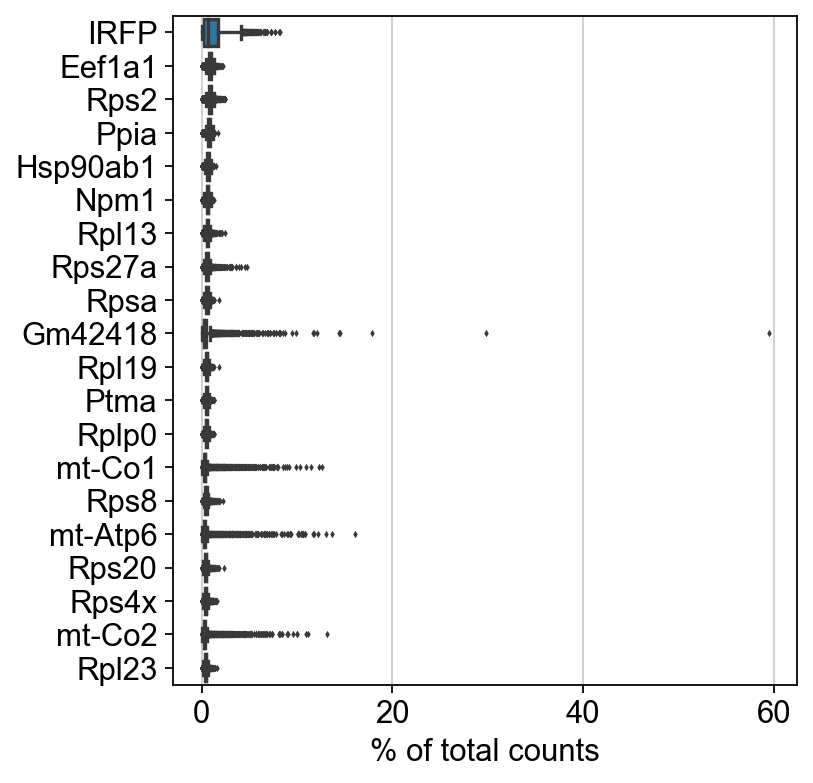

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20)

We are going to create filters on cells and genes that place the min number of genes (counts) per cell is 500, and that the minimum number of cells needed to include a gene in the var list is 3. 

In [8]:
#Set min_genes for a cell to be 500
sc.pp.filter_cells(t120_Gdata, min_genes=500)
#Set min number of cells expressing a gene for it to be included as 3
sc.pp.filter_genes(t120_Gdata, min_cells=3)
# This is a weaker threshold than above. It is just to population the n_counts column in adata
sc.pp.filter_cells(t120_Gdata, min_counts=3000)  

#Set min_genes for a cell to be 500
sc.pp.filter_cells(t120_Rdata, min_genes=500)
#Set min number of cells expressing a gene for it to be included as 3
sc.pp.filter_genes(t120_Rdata, min_cells=3)
# This is a weaker threshold than above. It is just to population the n_counts column in adata
sc.pp.filter_cells(t120_Rdata, min_counts=3000)  

#Set min_genes for a cell to be 500
sc.pp.filter_cells(adata, min_genes=500)
#Set min number of cells expressing a gene for it to be included as 3
sc.pp.filter_genes(adata, min_cells=3)
# This is a weaker threshold than above. It is just to population the n_counts column in adata
sc.pp.filter_cells(adata, min_counts=3000)  

filtered out 37 cells that have less than 500 genes expressed
filtered out 14556 genes that are detected in less than 3 cells
filtered out 118 cells that have less than 3000 counts
filtered out 44 cells that have less than 500 genes expressed
filtered out 15859 genes that are detected in less than 3 cells
filtered out 136 cells that have less than 3000 counts
filtered out 81 cells that have less than 500 genes expressed
filtered out 13906 genes that are detected in less than 3 cells
filtered out 254 cells that have less than 3000 counts


Histogram plotting log10 counts per cell vs the number of cells. This should tell us the average number of reads per cell in each lane of the 10x run. 

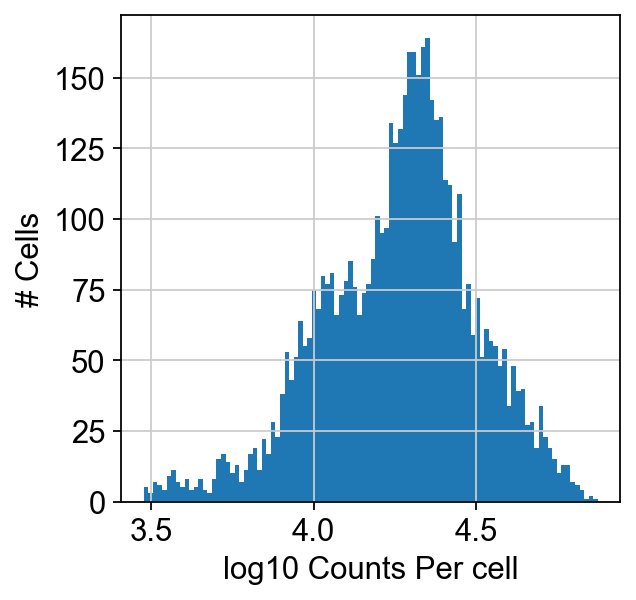

In [9]:
## plot log10 # counts per cell
plt.hist(np.log10(adata.obs['n_counts']), bins=100)
_ = plt.xlabel('log10 Counts Per cell')
_ = plt.ylabel('# Cells')

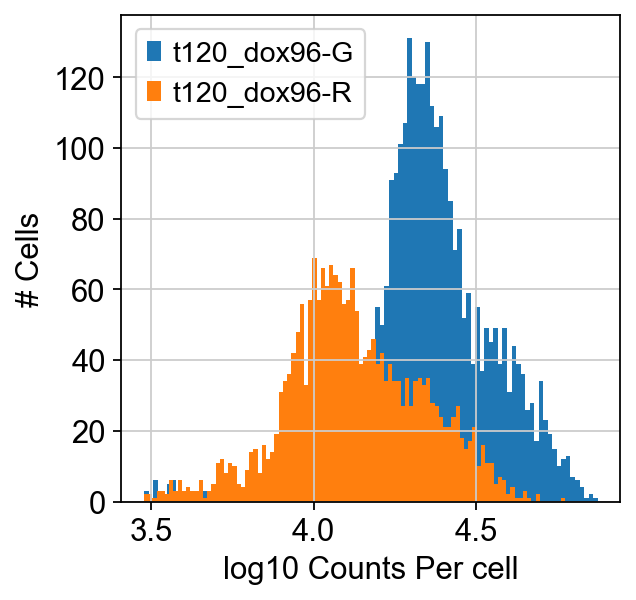

In [10]:
## plot log10 # counts per cell
plt.hist(np.log10(t120_Gdata.obs['n_counts']), bins=100)
_ = plt.xlabel('log10 Counts Per cell')
_ = plt.ylabel('# Cells')
## plot log10 # counts per cell
plt.hist(np.log10(t120_Rdata.obs['n_counts']), bins=100)
_ = plt.xlabel('log10 Counts Per cell')
_ = plt.ylabel('# Cells')
_ = plt.legend(['t120_dox96-G', 't120_dox96-R'])

# Generating mitochondrial and ribosomal count profiles for further filtering
Next we're identifying genes that are mitochondrial, ribosomal and hemoglobin.

In [11]:
#Add variables- if a gene starts with mt- label at is 'mt' (mitochondrial)
adata.var['mt']= adata.var_names.str.startswith('mt-')
#if a gene starts with rps or rpl- label at is 'ribo' (ribosomal)
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
#if a gene contains HbP in some capacity, label it 'hb'
adata.var['hb'] = adata.var_names.str.contains(("^Hb[^(P)]"))

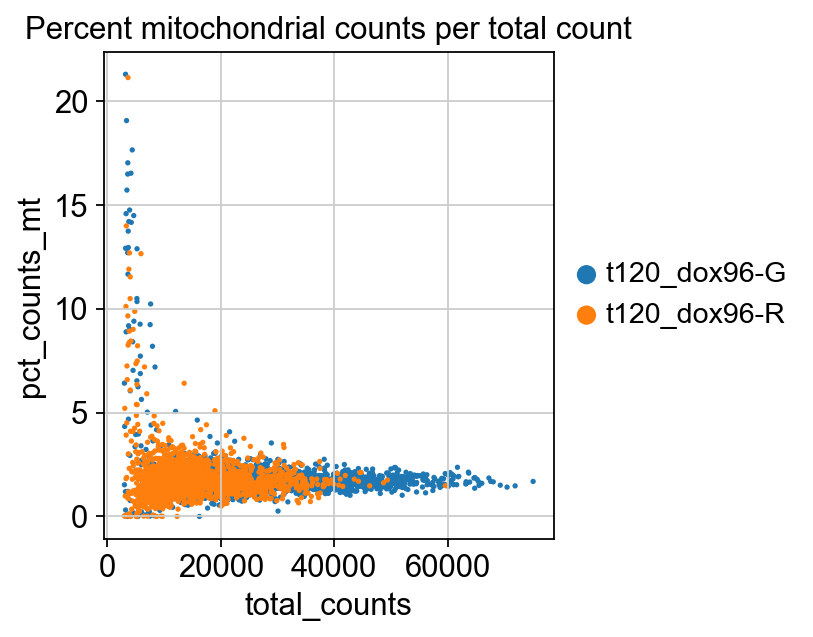

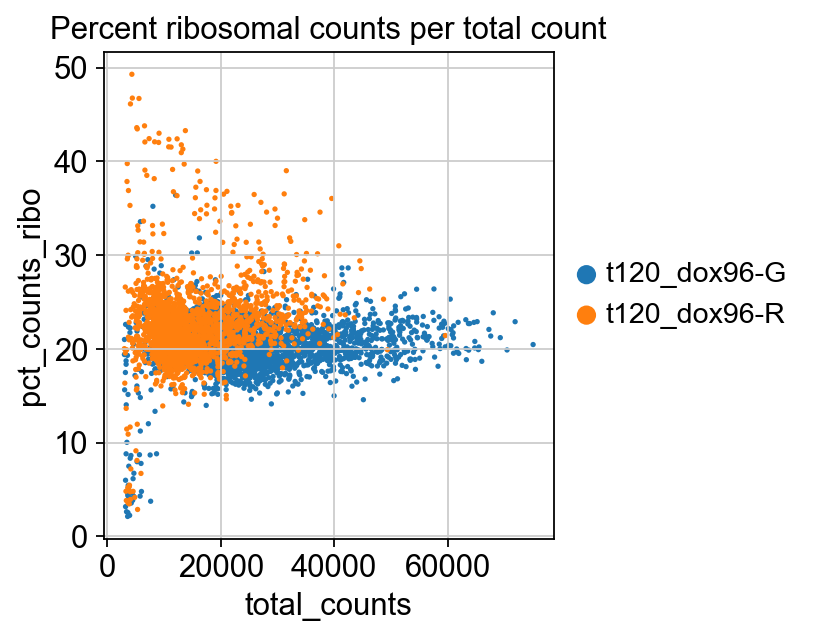

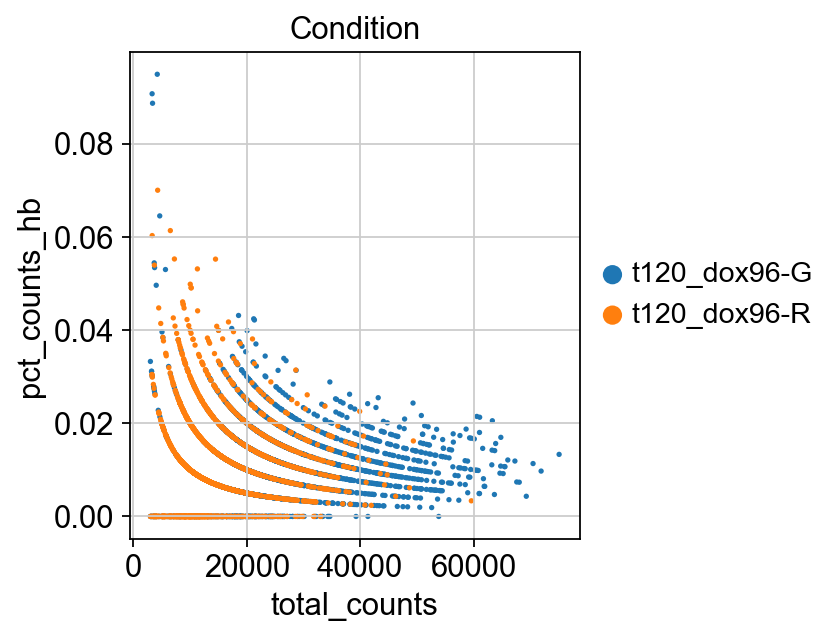

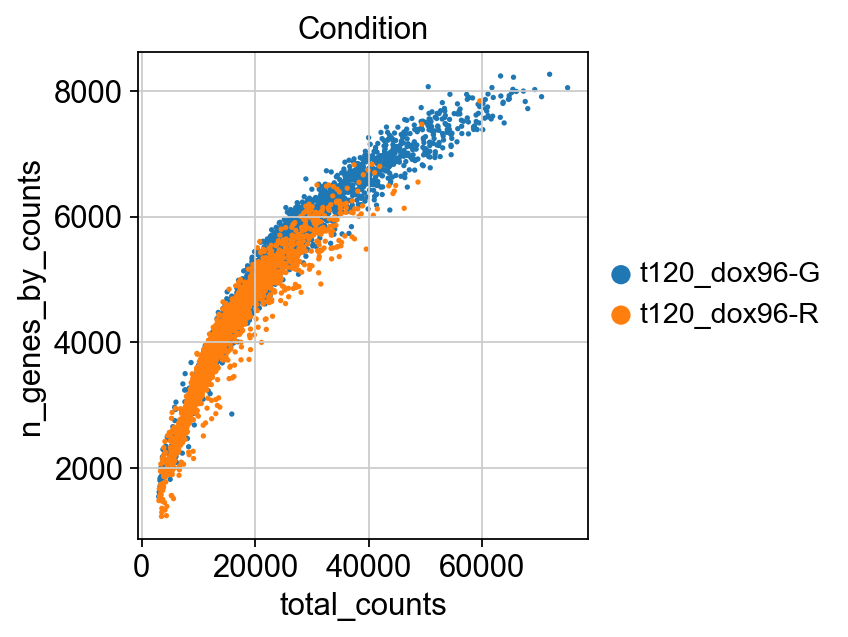

In [12]:
#Calculate QC metrics for all variables defined above and plot the versus 
#total counts
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], inplace=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt',color='Condition',title=
             'Percent mitochondrial counts per total count')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo',color='Condition',title=
             'Percent ribosomal counts per total count')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb',color='Condition')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',color='Condition')

In [13]:
# extra checks to see fraction of iRFP and rtTA in cells

#Add variables- if a gene starts with mt- label at is 'mt' (mitochondrial)
adata.var['iRFP']= adata.var_names.str.startswith('IRFP')
#if a gene starts with rps or rpl- label at is 'ribo' (ribosomal)
adata.var['rtTA'] = adata.var_names.str.startswith('rTTA')

sc.pp.calculate_qc_metrics(adata, qc_vars=['iRFP','rtTA'], inplace=True)

In [14]:
#We are going to define mitochondrial genes, and then compute the fraction of 
#counts of mitochondrial genes per total genes
mito_genes = adata.var_names.str.startswith('mt-')
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

In [15]:
#Print the variables
adata.var

,gene_ids,feature_types,genome,n_cells,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,iRFP,rtTA
Xkr4,ENSMUSG00000051951,Gene Expression,Mm10_custom_Wnt_reporter,44,False,False,False,43,0.008279,0.008245,99.172122,43.0,3.784190,False,False
Gm19938,ENSMUSG00000102331,Gene Expression,Mm10_custom_Wnt_reporter,54,False,False,False,53,0.010397,0.010343,98.979592,54.0,4.007333,False,False
Sox17,ENSMUSG00000025902,Gene Expression,Mm10_custom_Wnt_reporter,40,False,False,False,40,0.016173,0.016043,99.229881,84.0,4.442651,False,False
Mrpl15,ENSMUSG00000033845,Gene Expression,Mm10_custom_Wnt_reporter,4798,False,False,False,4769,3.636311,1.533919,8.182518,18887.0,9.846282,False,False
Lypla1,ENSMUSG00000025903,Gene Expression,Mm10_custom_Wnt_reporter,3697,False,False,False,3681,1.510204,0.920364,29.129765,7844.0,8.967631,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BFP,BFP,Gene Expression,Mm10_custom_Wnt_reporter,3357,False,False,False,3336,2.943589,1.372091,35.772045,15289.0,9.634954,False,False
iCre,iCre,Gene Expression,Mm10_custom_Wnt_reporter,5,False,False,False,5,0.000963,0.000962,99.903735,5.0,1.791759,False,False
IRFP,IRFP,Gene Expression,Mm10_custom_Wnt_reporter,5378,False,False,False,5166,254.322098,5.542526,0.539084,1320949.0,14.093862,True,False
rTTA,rTTA,Gene Expression,Mm10_custom_Wnt_reporter,3458,False,False,False,3411,7.561610,2.147288,34.328071,39275.0,10.578369,False,True


In [16]:
#Print the annotated object so we can see the obs and vars
adata

AnnData object with n_obs × n_vars = 5194 × 18384
    obs: 'Condition', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'total_counts_iRFP', 'log1p_total_counts_iRFP', 'pct_counts_iRFP', 'total_counts_rtTA', 'log1p_total_counts_rtTA', 'pct_counts_rtTA', 'percent_mt2'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'iRFP', 'rtTA'
    uns: 'Condition_colors'

In [17]:
# cell cycle analysis

cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
adata_cc_genes

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    385 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    385 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
computing PCA
    with n_comps=50
    finished (0:00:01)


AnnData object with n_obs × n_vars = 5194 × 92
    obs: 'Condition', 'batch', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'total_counts_iRFP', 'log1p_total_counts_iRFP', 'pct_counts_iRFP', 'total_counts_rtTA', 'log1p_total_counts_rtTA', 'pct_counts_rtTA', 'percent_mt2', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'iRFP', 'rtTA'
    uns: 'Condition_colors', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

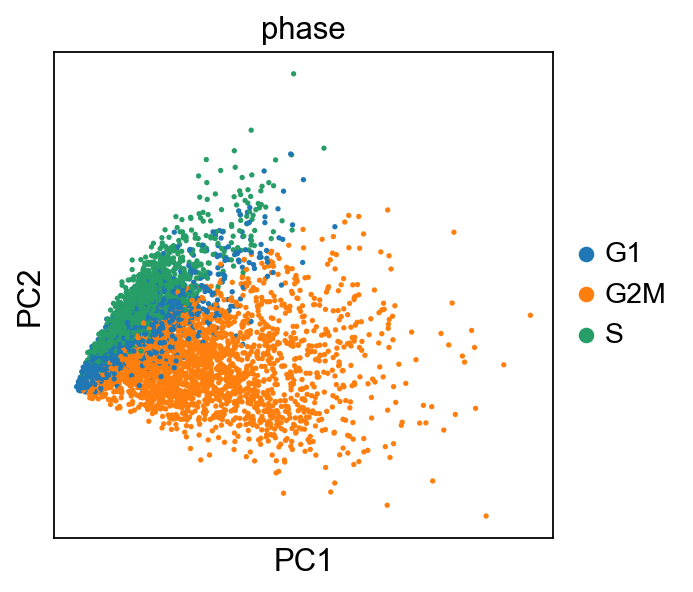

In [18]:
sc.pl.pca_scatter(adata_cc_genes, color='phase')

# Filtering the datasets

Now that we have defined different obs and vars, we can begin to filter the dataset based on specific parameters we define. We will bein by only counting cells below thresholds of mt and ribosomal reads

In [20]:
# update 11/1/22: use both mito and ribosomal counts to filter

#t96_data_f = t96_data[t96_data.obs.n_genes_by_counts < 1500, :]
#adata_f = adata[adata.obs.pct_counts_mt < 8, :]

idx1 = adata.obs.pct_counts_mt < 8;
idx2 = adata.obs.pct_counts_ribo < 30;
idx3 = np.logical_and(idx1,idx2)
adata_f = adata[idx3, :]

In [21]:
#Normalize the data to 10,000 reads
sc.pp.normalize_total(adata_f, target_sum=1e4)

C:\Users\harol\anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [22]:
#Log transform the data
sc.pp.log1p(adata_f)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


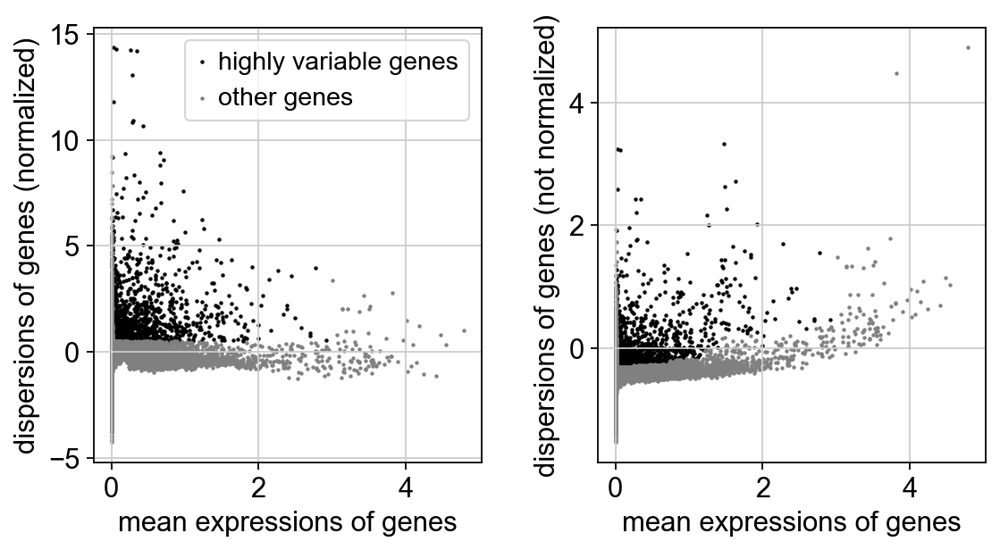

In [23]:
# ID highly variable genes in dataset
sc.pp.highly_variable_genes(adata_f, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_f)

In [24]:
# enforce that synthetic genes are not included in highly variable analysis


clone = adata_f.var['highly_variable']

tmp = adata.var_names.str.startswith('BFP')
tmp = adata.var_names.str.startswith(("BFP", "IRFP", "rTTA", "Stoplight"))
ridx, = np.where(tmp)

clone[ridx] = False

adata_f.var['highly_varible'] = clone
adata_f.var['highly_variable']


C:\Users\harol\AppData\Local\Temp\ipykernel_25992\2663151340.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clone[ridx] = False


Xkr4                  False
Gm19938               False
Sox17                 False
Mrpl15                False
Lypla1                False
                      ...  
BFP                   False
iCre                  False
IRFP                  False
rTTA                  False
Stoplight_Recorder    False
Name: highly_variable, Length: 18384, dtype: bool

In [25]:
adata.raw=adata_f

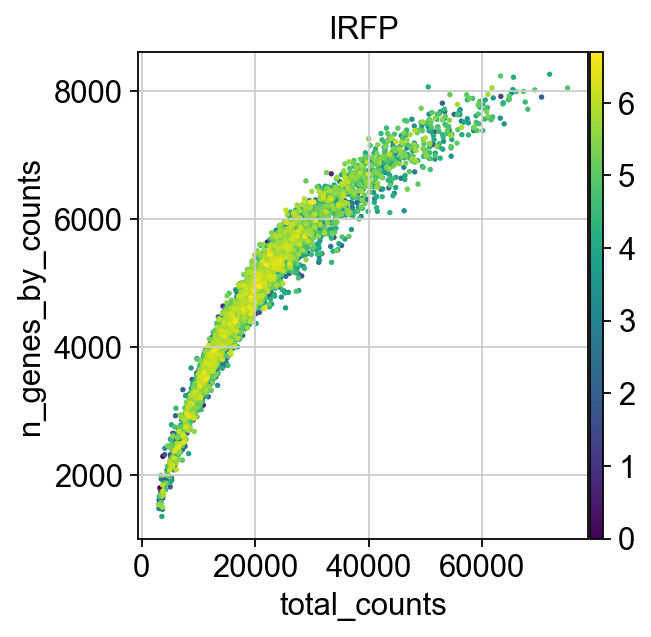

In [26]:
sc.pl.scatter(adata_f, x='total_counts', y='n_genes_by_counts', color='IRFP')

In [27]:
sc.pp.regress_out(adata_f, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:04:19)


In [28]:
sc.pp.scale(adata_f, max_value=10)

In [29]:
sc.tl.pca(adata_f, svd_solver='arpack', n_comps = 100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:03)


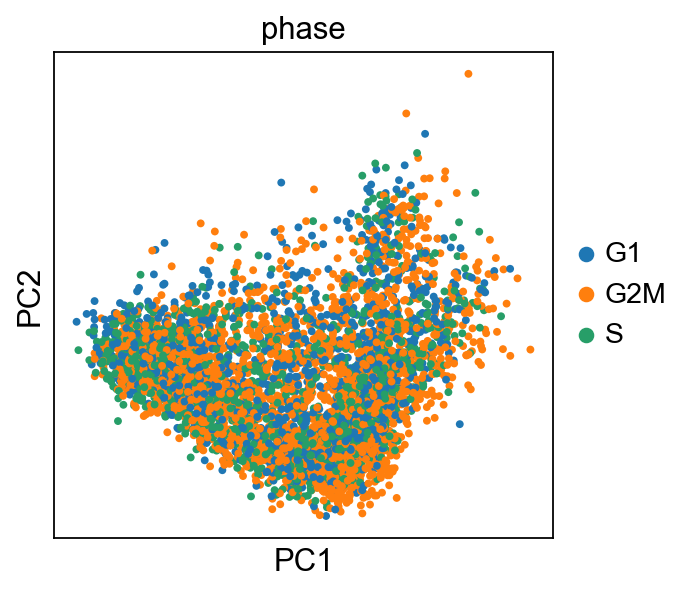

In [31]:
# re-check cell cycle distribution
sc.pl.pca(adata_f, color='phase',size=50)

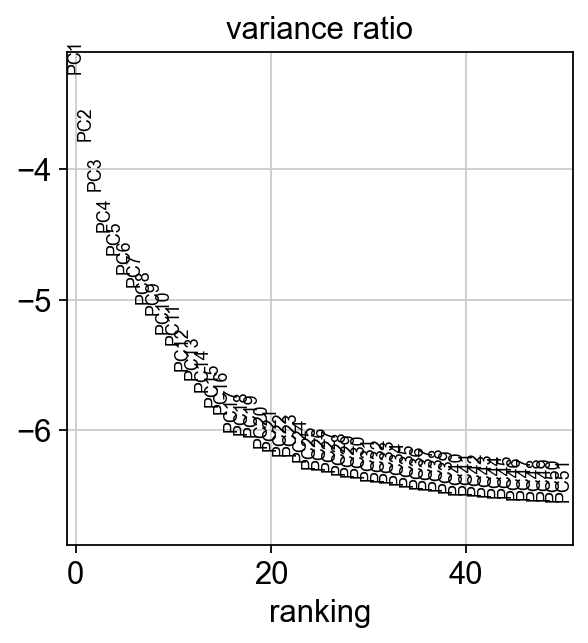

In [33]:
# visualize PC spectrum
sc.pl.pca_variance_ratio(adata_f, log=True,n_pcs = 50)

In [34]:
# find nearest neighbors. can tune parameters depending on structure of dataset
sc.pp.neighbors(adata_f, n_neighbors=20, n_pcs= 40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [35]:
# compute UMAP
sc.tl.umap(adata_f)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


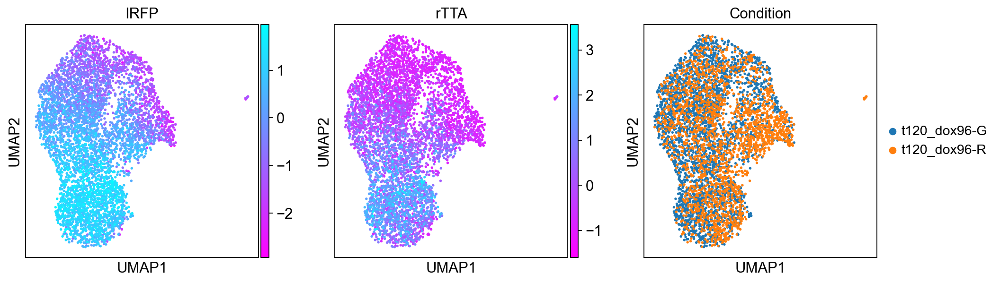

In [36]:
#visualize synthetic reporter genes without saving first
sc.pl.umap(adata_f, color=['IRFP', 'rTTA', 'Condition'], color_map = 'cool_r')

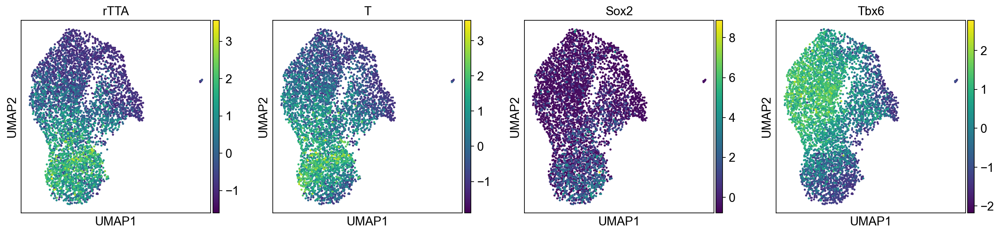

In [37]:
# visualize genes of interest
sc.pl.umap(adata_f, color=['rTTA', 'T', 'Sox2', 'Tbx6'])

In [38]:
# identify cell type clusters with Leiden clustering
sc.tl.leiden(adata_f, resolution=0.6)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


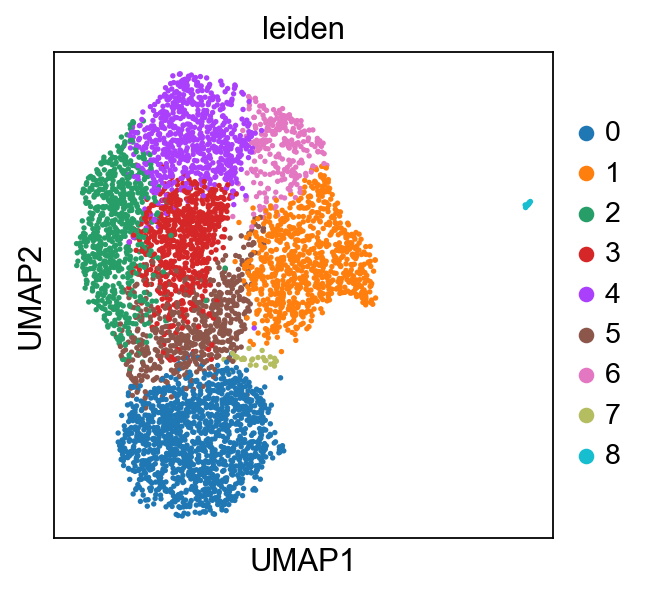

In [39]:
# visualize clusters
sc.pl.umap(adata_f, color=['leiden'])

pd.DataFrame(adata_f.uns['rank_genes_groups']['names']).head(20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\harol\anaconda3\lib\site-packages\scanpy\tools\_rank_gen

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_leiden']`


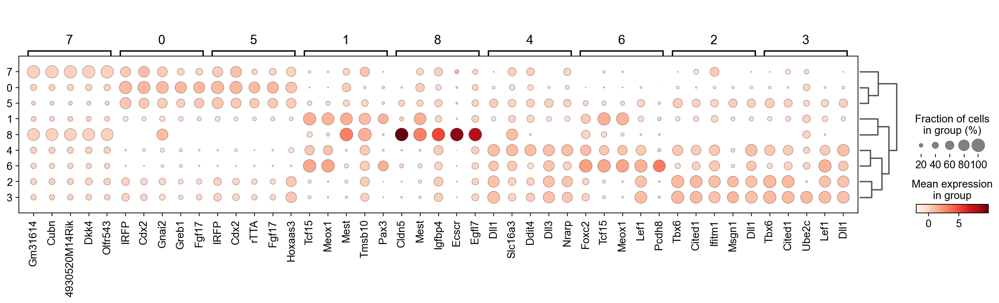

In [41]:
#without saving first
sc.tl.rank_genes_groups(adata_f, groupby = "leiden")
sc.pl.rank_genes_groups_dotplot(adata_f, n_genes = 5)

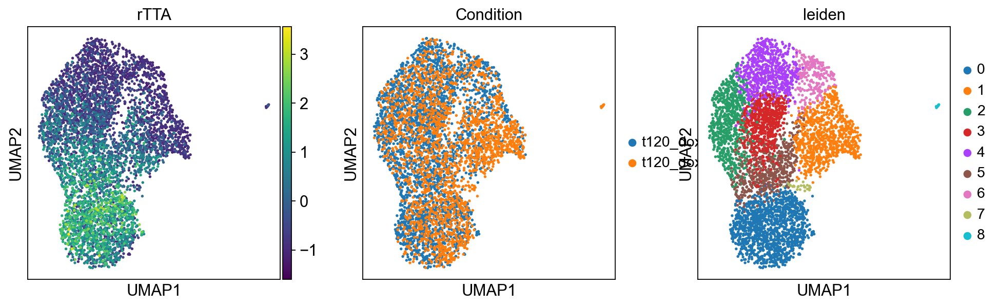

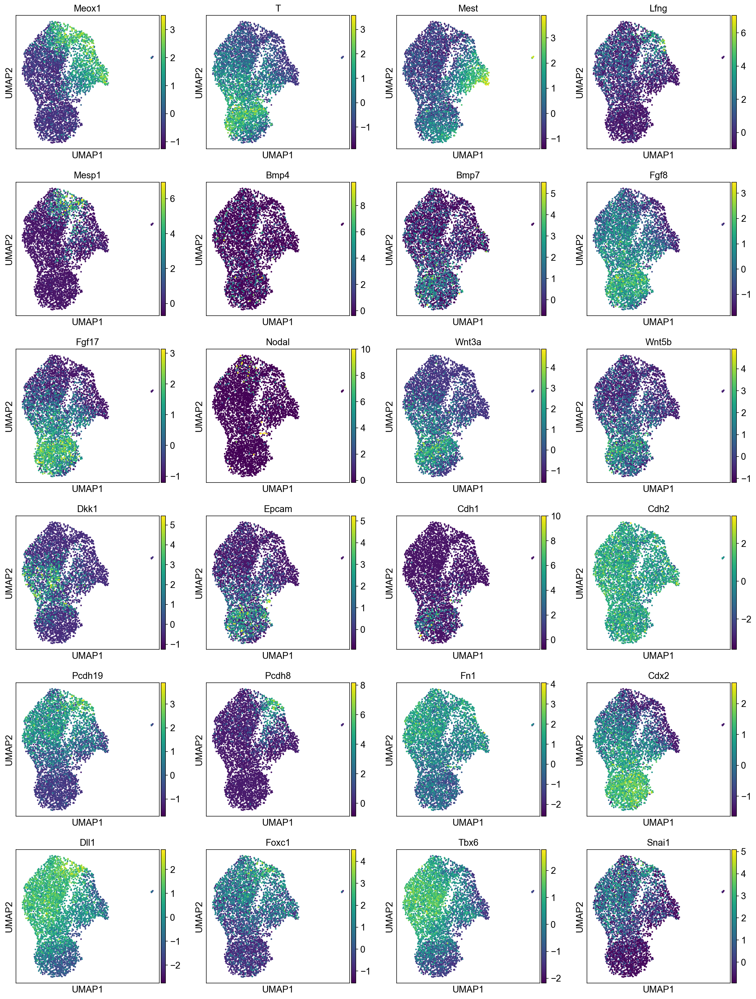

In [46]:
# redo distribution plots, with genes from our data set
sc.pl.umap(adata_f, color=['rTTA', 'Condition', 'leiden'], save='t120_clusters_example.png')
sc.pl.umap(adata_f, color=['Meox1','T','Mest', 'Lfng', 'Mesp1', 'Bmp4', 'Bmp7', 'Fgf8', 'Fgf17','Nodal','Wnt3a', 'Wnt5b','Dkk1','Epcam', 'Cdh1', 'Cdh2', 'Pcdh19', 'Pcdh8','Fn1','Cdx2', 'Dll1', 'Foxc1', 'Tbx6', 'Snai1'], save='t120_GOIs_ex.svg')

Condition,t120_dox96-G,t120_dox96-R
leiden,,
0,0.606471,0.393529
1,0.314070,0.685930
2,0.699717,0.300283
3,0.631424,0.368576
4,0.663235,0.336765
5,0.653779,0.346221
6,0.698795,0.301205
7,0.037037,0.962963
8,0.000000,1.000000


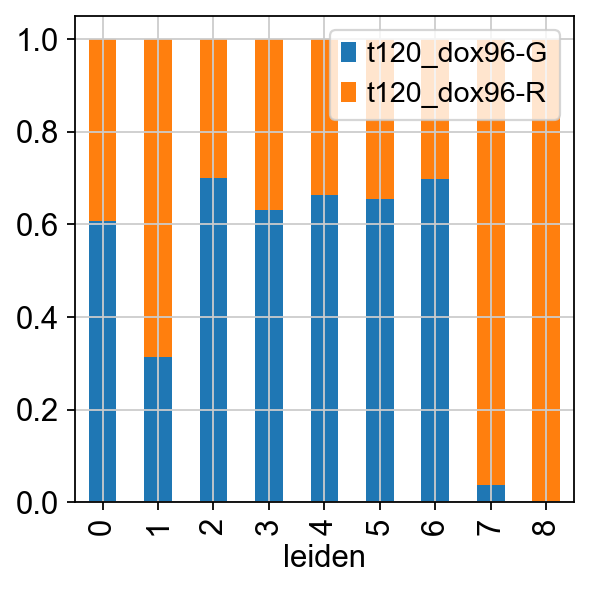

In [47]:
# visualize relative distribution of recording conditions within clusters
xtab1 = pd.crosstab(adata_f.obs['leiden'],adata_f.obs['Condition'], normalize='index')
xtab1.plot.bar(stacked=True).legend(loc='upper right')
xtab1

Condition,t120_dox96-G,t120_dox96-R
leiden,,
0,806,523
1,250,546
2,494,212
3,430,251
4,451,229
5,372,197
6,174,75
7,1,26
8,0,12


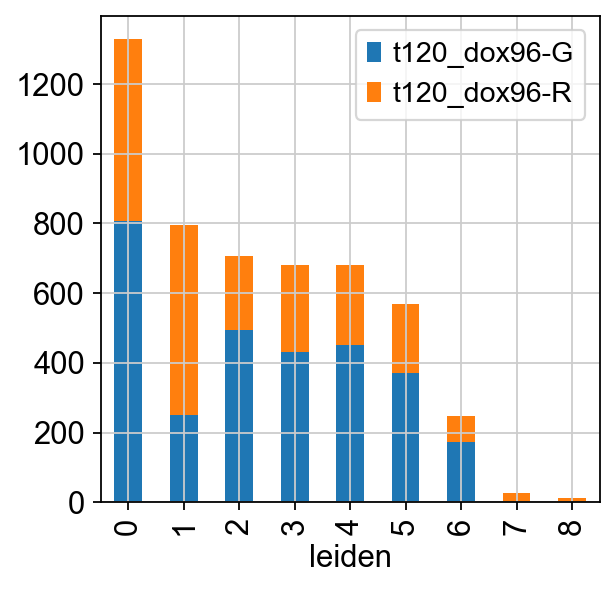

In [48]:
# look at raw cross-tabulation?
xtabraw = pd.crosstab(adata_f.obs['leiden'],adata_f.obs['Condition'])
xtabraw.plot.bar(stacked=True).legend(loc='upper right')
xtabraw


Condition,t120_dox96-G,t120_dox96-R
leiden,,
0,0.270651,0.252535
1,0.083949,0.263641
2,0.165883,0.102366
3,0.144392,0.121197
4,0.151444,0.110575
5,0.124916,0.095123
6,0.058428,0.036214
7,0.000336,0.012554
8,0.000000,0.005794


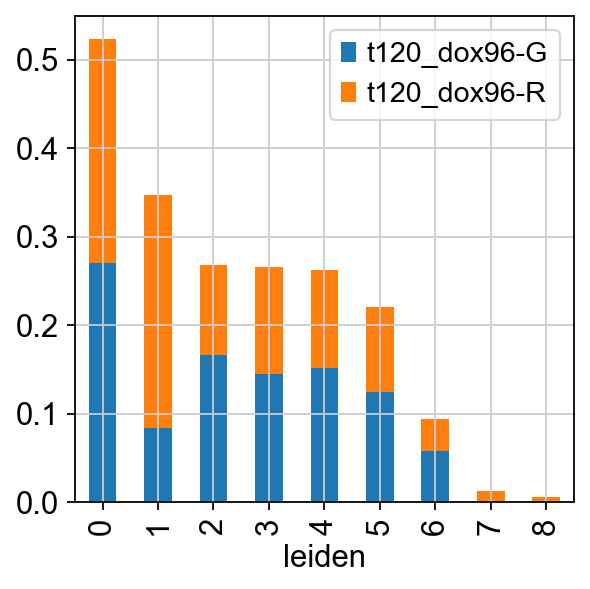

In [49]:
# analyze relative contributions to clusters?

# use crosstab before, divdided by relative ratio of G and R in dataset


tmp = adata_f.obs['Condition'] == 't120_dox96-R'
NRed = sum(tmp)

tmp = adata_f.obs['Condition'] == 't120_dox96-G'
NGreen = sum(tmp)

Ntot = NRed + NGreen

greencounts_norm = xtabraw['t120_dox96-G']/NGreen
redcounts_norm = xtabraw['t120_dox96-R']/NRed

# calculate relative proportion of green and red, normalized for total counts
normfrac = greencounts_norm / (greencounts_norm + redcounts_norm)
normfrac



normxtab = xtab1
normxtab['t120_dox96-G'] = greencounts_norm
normxtab['t120_dox96-R'] = redcounts_norm
normxtab.plot.bar(stacked=True).legend(loc='upper right')

xtab1
#normxtab = pd.crosstab(greencounts_norm,redcounts_norm, normalize='index')
#normxtab.plot.bar(stacked=True).legend(loc='upper right')
#normxtab

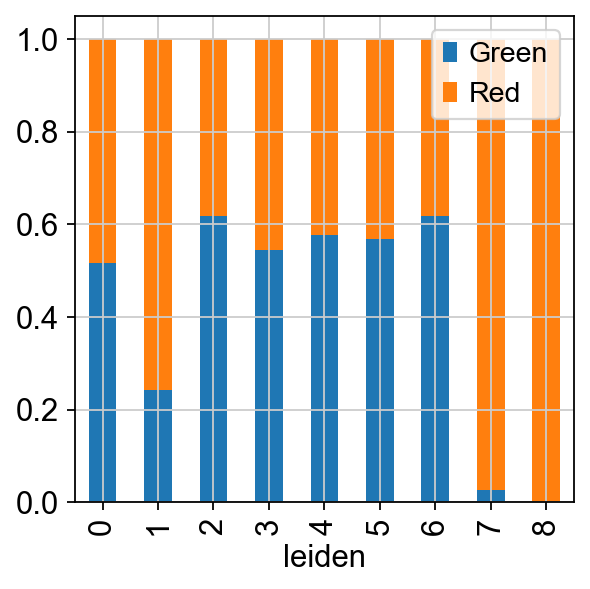

In [50]:
tmp = pd.DataFrame()
tmp['Green'] = normfrac
tmp['Red'] = 1 - normfrac

ax = tmp.plot.bar(stacked=True).legend(loc='upper right')
fig = ax.get_figure()
fig.savefig('t120_clusterfracs_bar.svg')

In [51]:
# add label based on fracitonal profiles?

[a,b] = adata_f.shape

tmparray = np.zeros(a)

# loop through clusters
Lmax = max(adata_f.obs['leiden'])
Lmin = min(adata_f.obs['leiden'])

for l in range(int(Lmax)):
    # find corresponding cells
    incluster = adata_f.obs['leiden']==str(l)
    # assign frac value
    ridx = np.where(incluster)
    tmparray[ridx] = normfrac[l]


#sc.pl.umap(adata_f, color=['IRFP', 'rTTA', 'Condition'])
adata_f.obs['fracprof'] = tmparray

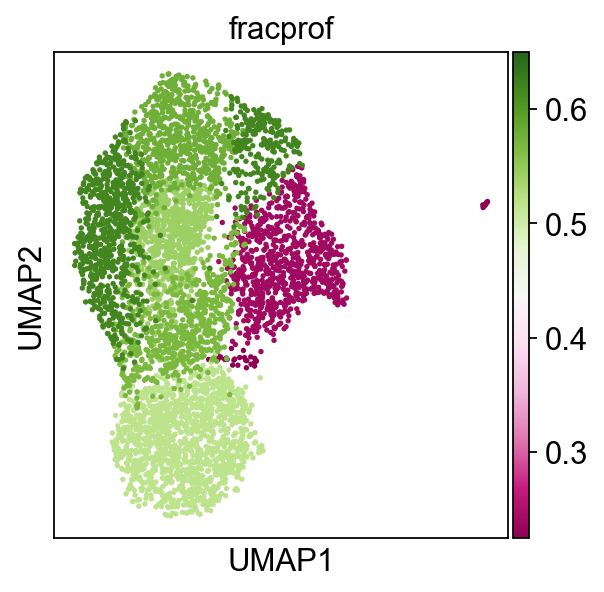

In [54]:
# annotate clusters with recording fraction
sc.pl.umap(adata_f, color=['fracprof'], color_map = 'PiYG', vmin = 0.65, vmax = 0.25)